# Building Extraction from Historical Map using Machine Learning


## Introduction

### What this notebook is about

This notebook is a proof of concept for extracting useful information from old historical map. Old maps are windows to the past: they could give us a picture of what and how things are arranged back then, so that we could learn from the past. Aside from the quirks of its beautiful cartographies, old maps could give us meaningful information about toponyms, location and shape of historical buildings, abandoned roads, urbanization growth, etc. 

The purpose of this notebook is to show that usefull information could be automatically extracted from these maps using computer vision and machine learning. This will help obtaining valuable data for further analysis.

### About the data

The "Jogjakarta en Omstreken" is a map from Colonial era of Indonesia in 1925. The map depict titular area of Yogyakarta, a center of cultural and historical importance in Indonesia. The map shows Town plan of Yogyakarta in Java, Indonesia, showing roads, boundaries, water features, vegetation, cultivation, swamps, buildings and built-up areasm and also relief which depicted by contours. The map is a collection of https://trove.nla.gov.au/m and could be accessed freely from [here](https://nla.gov.au/nla.obj-649375951/view)

## Data Wrangling and Preparation

### Install Dependencies

In [1]:
!pip install rasterio geopandas shapely opencv-python sklearn descartes

### Loading libraries


In [2]:
import os
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import cv2
from shapely.geometry import mapping


### Loading Data

In [3]:
if not os.path.exists('jogja.tif'):
    !wget https://drive.google.com/uc?id=1G1--4hO5vlUSH9xEGRPH_CGbTJ5XduF5 -O jogja.tif
else: print('filexist: jogja.tif')
#!wget https://github.com/danylaksono/historical-map-extraction/blob/main/Data/jogja_10000_1925.tif -O jogja.tif

if not os.path.exists('clipper.zip'):
    !wget https://github.com/danylaksono/historical-map-extraction/blob/main/Data/clipper.zip -O clipper.zip
else: print('filexist: clipper.zip')

filexist: jogja.tif
filexist: clipper.zip


### Display the map

EPSG:4326
{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 5002, 'height': 4463, 'count': 4, 'crs': CRS.from_epsg(4326), 'transform': Affine(1.6250758479900898e-05, 0.0, 110.32798548245933,
       0.0, -1.6250758479900898e-05, -7.760966807896364)}


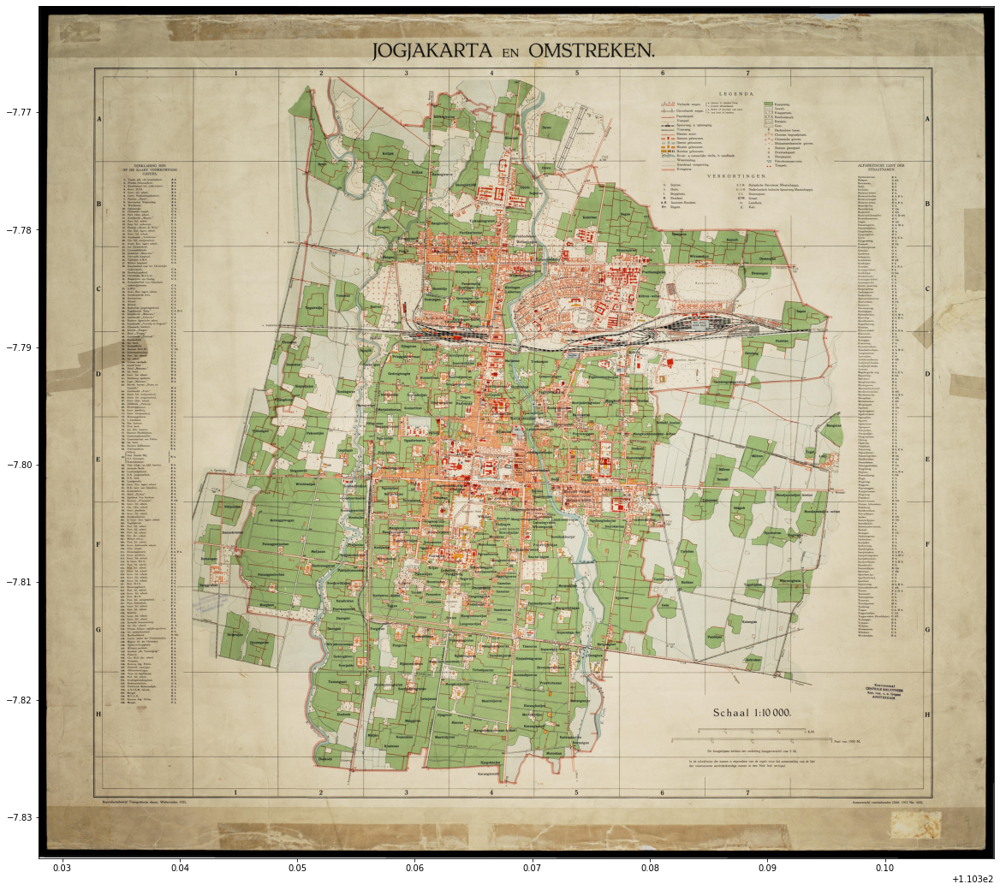

In [4]:
from matplotlib import pyplot as plt
from rasterio.plot import show

# enlarge the plot
plt.rcParams["figure.figsize"] = (20,20)


# calling the image as source
# python 'with' ensures that the file is closed after the iteration
with rasterio.open("jogja.tif") as src:
  # checking the loaded data
  print(src.crs)
  print(src.meta)
  show(src.read(), transform=src.transform)

### Clip the map

In [5]:
url = 'https://raw.githubusercontent.com/danylaksono/historical-map-extraction/main/Data/clipper.geojson'
shapes = gpd.read_file(url)
print(shapes.head())

                                            geometry
0  POLYGON ((110.35370 -7.76704, 110.35206 -7.767...


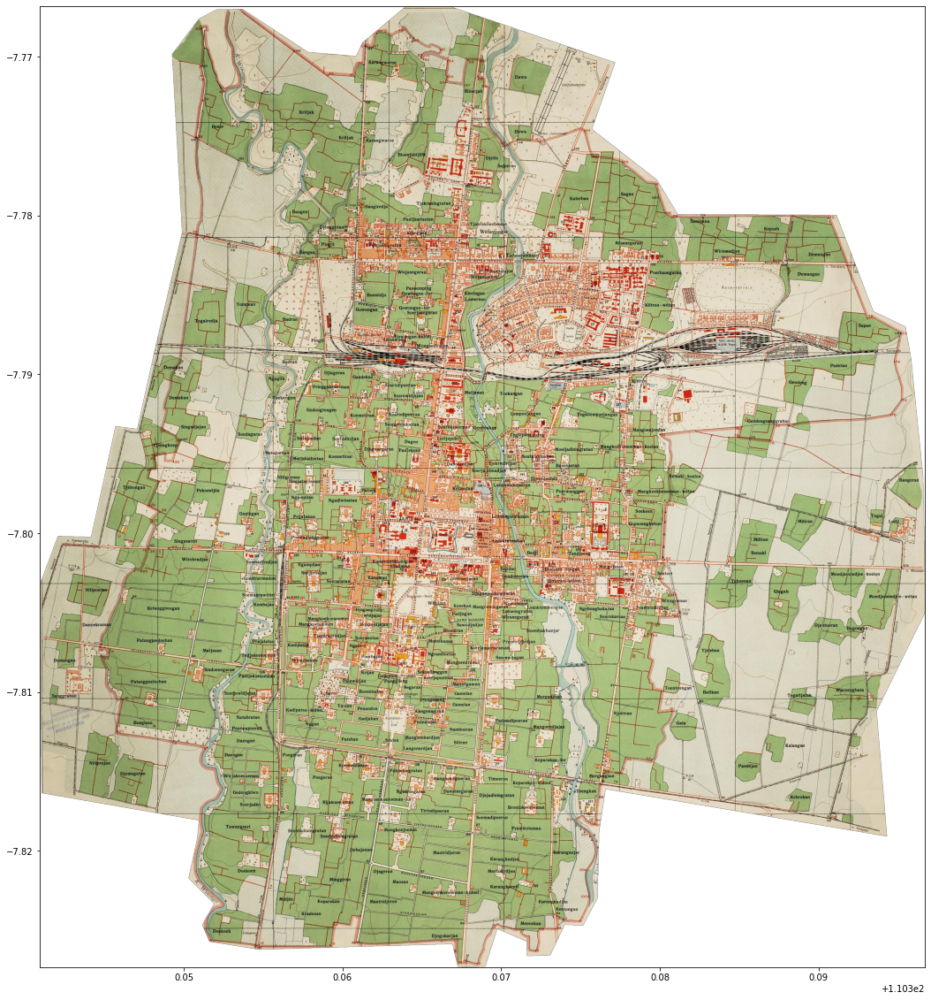

<AxesSubplot:>

In [6]:
# clip the image
with rasterio.open("jogja.tif") as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes.geometry, crop=True)
    out_meta = src.meta
    
# update metadata for writing
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

# write the clipped image
with rasterio.open("jogja_clipped.tif", "w", **out_meta) as dest:
    dest.write(out_image)

# show clipped map
clippedsrc = rasterio.open("jogja_clipped.tif")
show(clippedsrc.read(), transform=clippedsrc.transform)

In [7]:
print(clippedsrc.height)
print(clippedsrc.width)


3724
3433


In [8]:
#clippedsrc.close()

## Image extraction

### Get a subset of the map

Let's test our image extraction algoritm to a subset of the map. 


(3, 800, 1200)


<AxesSubplot:>

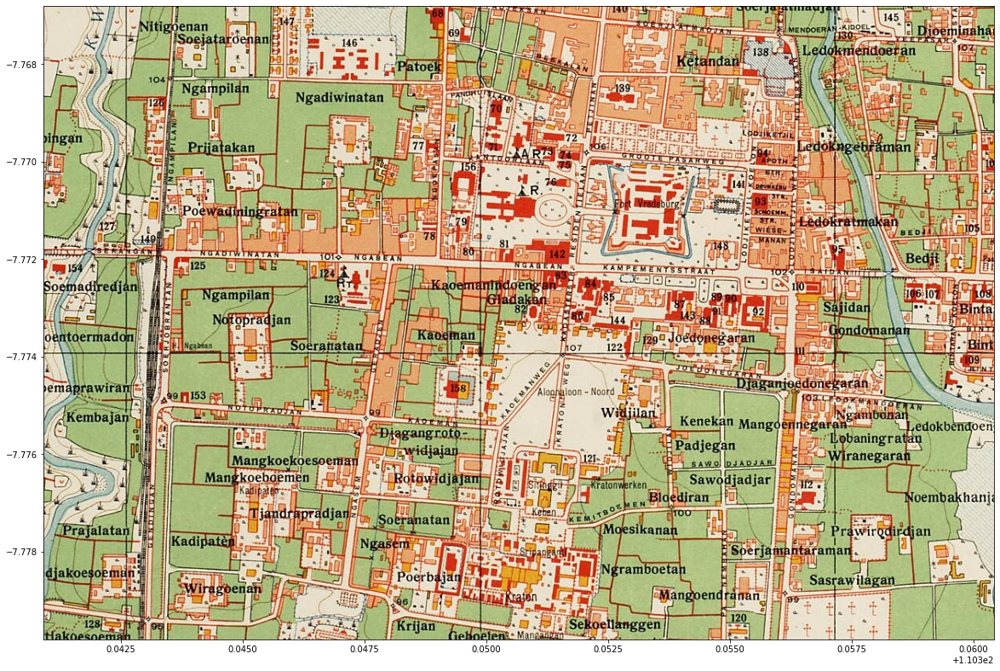

In [9]:
import matplotlib.pyplot as plt
from rasterio.plot import show

clipped_img = clippedsrc.read([1,2,3])[:, 1800:2600, 800:2000]

# update metadata for writing
out_meta.update({"driver": "JPEG",
                 "height": clipped_img.shape[1],
                 "width": clipped_img.shape[2],
                 'count': 3,
                 "transform": clippedsrc.transform})

with rasterio.open("jogja_subset.jpg", "w", **out_meta) as dest:
    dest.write(clipped_img)
    
print(clipped_img.shape)
fig, ax = plt.subplots(figsize=(20,17))
show(clipped_img[:, :, :], ax=ax, transform=clippedsrc.transform)

### Extract object by color

We're going to experiment with OpenCV's functions to extract useful information from an image

In [10]:
import cv2

#from google.colab.patches import cv2_imshow

img = cv2.imread('jogja_subset.jpg')


print(img.shape) #menampilkan resolusi
print(img.size) #menampilkan ukuran data pada media penyimpan
print(img.dtype) #image datatype (kedalaman bit) 


(800, 1200, 3)
2880000
uint8


We could employ simple color extraction by converting the image's colorspace to HSV. This will make selecting object easier compared to RGB colorspace. As a reference, here is the 'hue' band which contains all the colors:

![Hue Scale](https://upload.wikimedia.org/wikipedia/commons/thumb/a/ad/HueScale.svg/360px-HueScale.svg.png)

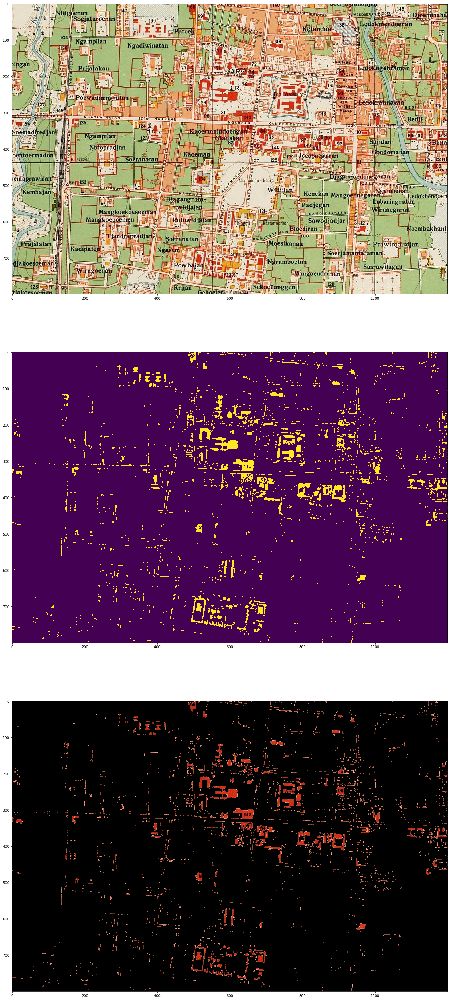

In [11]:
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV);

batas_bawah = 1 #lower threshold for buildings
batas_atas = 8 #Upper threshold for buildings

lower_sv = np.array([batas_bawah,100,100])
upper_sv = np.array([batas_atas,255,255])

# membuat masking untuk mencari objek sesuai batas warna
mask = cv2.inRange(hsv, lower_sv, upper_sv)

# Operasi Bitwise-AND 
res = cv2.bitwise_and(img, img, mask=mask)

fig, axs = plt.subplots(3,1,figsize=(50,50))

axs[0].imshow(img[:, :, [2, 1, 0]])
axs[1].imshow(mask)
axs[2].imshow(res[:, :, [2, 1, 0]])

### Image Filtering

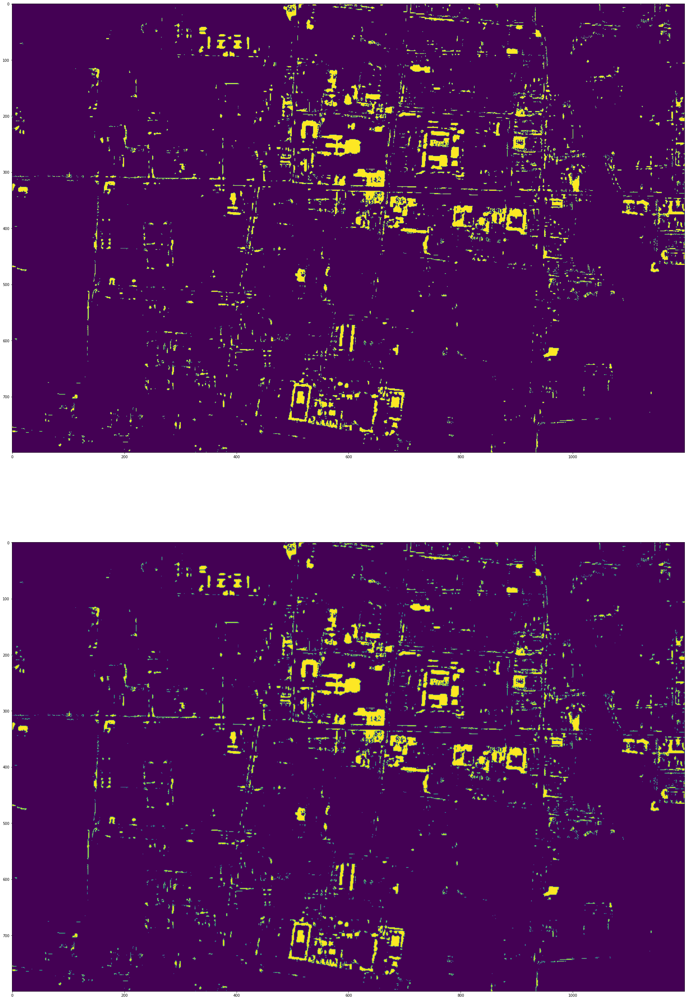

In [12]:
blur = cv2.bilateralFilter(mask,9,100,100)
fig, axs = plt.subplots(2,1,figsize=(50,50))
axs[0].imshow(mask)
axs[1].imshow(blur)


### Erosion and Dilation

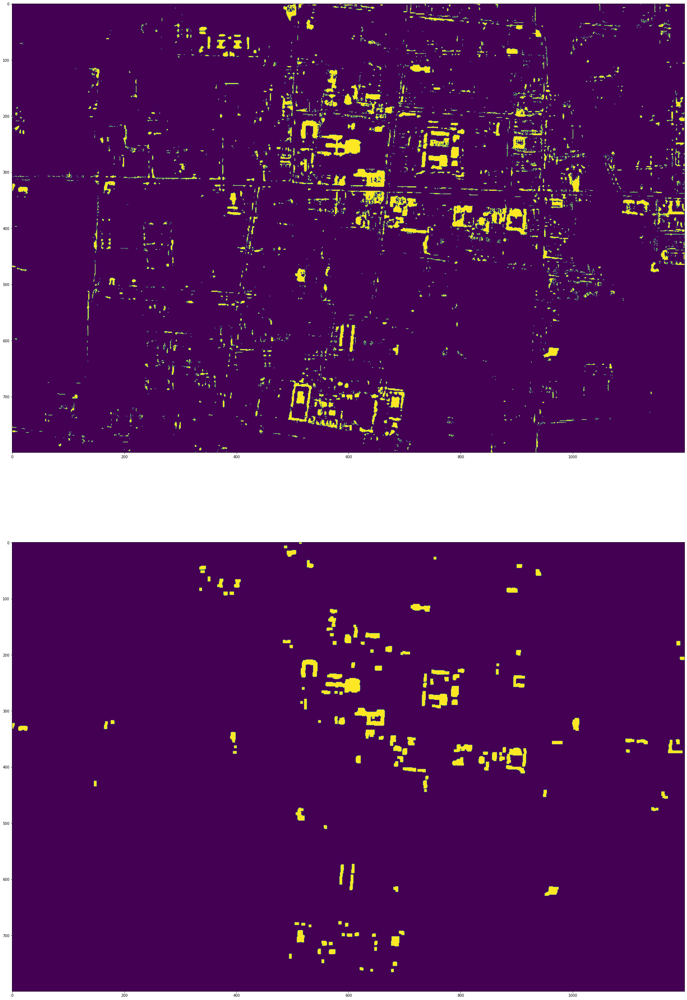

In [13]:
kernel = np.ones((5,5),np.uint8)

closing = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel)
erosion = cv2.erode(mask,kernel,iterations = 1)
dilation = cv2.dilate(erosion,kernel,iterations = 1)


fig, axs = plt.subplots(2,1,figsize=(50,50))
axs[0].imshow(mask)
axs[1].imshow(dilation)

### Image Thresholding

In [22]:
#ret,th = cv2.threshold(dilation,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

image, contours, hierarchy = cv2.findContours(dilation,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

fig, axs = plt.subplots(2,1,figsize=(50,50))
axs[0].imshow(image)
axs[1].imshow(contours)

ValueError: not enough values to unpack (expected 3, got 2)

## Image Classification with Machine Learning

### Preparing data

In [15]:
!wget https://github.com/danylaksono/historical-map-extraction/blob/main/Data/training.geojson -O training.geojson

--2020-11-13 00:57:25--  https://github.com/danylaksono/historical-map-extraction/blob/main/Data/training.geojson
Resolving github.com (github.com)... 13.229.188.59
Connecting to github.com (github.com)|13.229.188.59|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘training.geojson’

training.geojson        [ <=>                ]  93.72K  --.-KB/s    in 0.003s  

2020-11-13 00:57:25 (32.1 MB/s) - ‘training.geojson’ saved [95967]



In [16]:
training = gpd.read_file('https://raw.githubusercontent.com/danylaksono/historical-map-extraction/main/Data/training.geojson')
training.crs


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

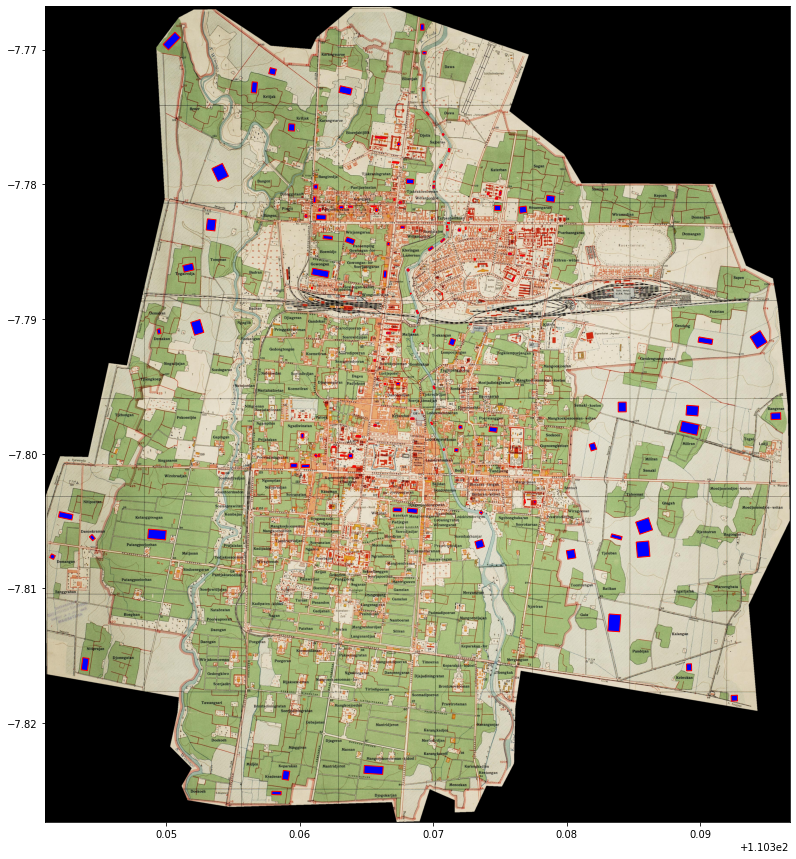

In [17]:
# plot training data and image
fig, ax = plt.subplots(figsize=(15, 15))
rasterio.plot.show(clippedsrc, ax=ax)
training.plot(ax=ax, facecolor='blue', edgecolor='r');

In [18]:
# jumlah data
len(training)

120

In [19]:
X = np.array([], dtype=np.int8).reshape(0,4) # pixels for training
y = np.array([], dtype=np.string_) # labels for training

In [20]:
# saving geometry values
geoms = training.geometry.values 

# extract the raster values within the polygon 
with rasterio.open("jogja_clipped.tif") as src:
    band_count = src.count
    for index, geom in enumerate(geoms):
        feature = [mapping(geom)]

        # the mask function returns an array of the raster pixels within this feature
        out_image, out_transform = mask(src, feature, crop=True) 
        # eliminate all the pixels with 0 values for all 8 bands - AKA not actually part of the shapefile
        out_image_trimmed = out_image[:,~np.all(out_image == 0, axis=0)]
        # eliminate all the pixels with 255 values for all 8 bands - AKA not actually part of the shapefile
        out_image_trimmed = out_image_trimmed[:,~np.all(out_image_trimmed == 255, axis=0)]
        # reshape the array to [pixel count, bands]
        out_image_reshaped = out_image_trimmed.reshape(-1, band_count)
        # append the labels to the y array
        y = np.append(y,[training["class"][index]] * out_image_reshaped.shape[0]) 
        # stack the pizels onto the pixel array
        X = np.vstack((X,out_image_reshaped))        


TypeError: 'numpy.ndarray' object is not callable

In [ ]:
# What are our classification labels?
labels = np.unique(training["class"])
print('The training data include {n} classes: {classes}\n'.format(n=labels.size, 
                                                                classes=labels))

# We will need a "X" matrix containing our features, and a "y" array containing our labels
print('Our X matrix is sized: {sz}'.format(sz=X.shape))
print('Our y array is sized: {sz}'.format(sz=y.shape))

### Plot to check

In [ ]:
fig, ax = plt.subplots(1,3, figsize=[20,4])

# numbers 1-8
band_count = np.arange(1,5)

classes = np.unique(y)
for class_type in classes:
    band_intensity = np.mean(X[y==class_type, :], axis=0)
    ax[0].plot(band_count, band_intensity, label=class_type)
    ax[1].plot(band_count, band_intensity, label=class_type)
    ax[2].plot(band_count, band_intensity, label=class_type)
# plot them as lines

# Add some axis labels
ax[0].set_xlabel('Band #')
ax[0].set_ylabel('Reflectance Value')
ax[1].set_ylabel('Reflectance Value')
ax[1].set_xlabel('Band #')
ax[2].set_ylabel('Reflectance Value')
ax[2].set_xlabel('Band #')
#ax[0].set_ylim(32,38)
ax[1].set_ylim(32,38)
ax[2].set_ylim(70,140)
#ax.set
ax[1].legend(loc="upper right")
# Add a title
ax[0].set_title('Band Intensities Full Overview')
ax[1].set_title('Band Intensities Lower Ref Subset')
ax[2].set_title('Band Intensities Higher Ref Subset')

### Train


In [ ]:
#from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(X, y)

In [ ]:
from rasterio.plot import show
from rasterio.plot import show_hist
from rasterio.windows import Window
from rasterio.plot import reshape_as_raster, reshape_as_image

In [ ]:
with rasterio.open("jogja_clipped.tif") as src:
    # may need to reduce this image size if your kernel crashes, takes a lot of memory
    img = src.read() #[:, 150:600, 250:1400]

# Take our full image and reshape into long 2d array (nrow * ncol, nband) for classification
print(img.shape)
reshaped_img = reshape_as_image(img)
print(reshaped_img.shape)

In [ ]:
class_prediction = gnb.predict(reshaped_img.reshape(-1, 4))
#class_prediction = gnb.predict(reshaped_img)
print(class_prediction)

# Reshape our classification map back into a 2D matrix so we can visualize it
class_prediction = class_prediction.reshape(reshaped_img[:, :, 0].shape)

In [ ]:
class_prediction

In [ ]:
def str_class_to_int(class_array):
    class_array[class_array == '1'] = 1
    class_array[class_array == '2'] = 2
    class_array[class_array == '3'] = 3
    class_array[class_array == '4'] = 4
    class_array[class_array == '5'] = 5
    return(class_array.astype(int))

class_prediction = str_class_to_int(class_prediction)

In [ ]:
with open("classification_result.txt", "w") as file:
    file.write(class_prediction)

### Convert prediction to raster

In [ ]:
arr = class_prediction.astype('uint8')
print(arr.shape)
clippedsrc = rasterio.open("jogja_clipped.tif")

# update metadata for writing
out_meta.update({"driver": "GTiff",
                 "height": arr.shape[0],
                 "width": arr.shape[1],
                 "crs":clippedsrc.crs,
                 "transform": clippedsrc.transform})

# write the clipped image
with rasterio.open("classified.tif", "w", **out_meta) as dest:
    dest.write(arr, 1)

# show clipped map
#classifiedsrc = rasterio.open("classified.tif")
#show(classifiedsrc.read(), transform=classifiedsrc.transform)



In [ ]:
arr


### Convert to Polygon

In [ ]:
#from shapely.geometry import Polygon
#polygon = Polygon(class_prediction)
#print(polygon.wkt)

### Display classification result

In [ ]:
def color_stretch(image, index):
    colors = image[:, :, index].astype(np.float64)
    for b in range(colors.shape[2]):
        colors[:, :, b] = rasterio.plot.adjust_band(colors[:, :, b])
    return colors
    
# find the highest pixel value in the prediction image
n = int(np.max(class_prediction))

# next setup a colormap for our map
colors = dict((
    (0, (48, 156, 214, 255)),   # Blue - Water
    (1, (139,69,19, 255)),      # Brown - WetSand
    (2, (96, 19, 134, 255)),    # Purple - Emergent Wetland
    (3, (244, 164, 96, 255)),   # Tan - Sand
    (4, (206, 224, 196, 255)),  # Lime - Herbaceous
    (5, (34, 139, 34, 255)),    # Forest Green - Forest 
))

# Put 0 - 255 as float 0 - 1
for k in colors:
  v = colors[k]
  _v = [_v / 255.0 for _v in v]
  colors[k] = _v
    
index_colors = [colors[key] if key in colors else 
    (255, 255, 255, 0) for key in range(0, n+1)]

cmap = plt.matplotlib.colors.ListedColormap(index_colors, 'Classification', n+1)

In [ ]:
fig, axs = plt.subplots(2,1,figsize=(50,20))

img_stretched = color_stretch(reshaped_img, [1, 2, 3])
axs[0].imshow(reshaped_img)

axs[1].imshow(class_prediction, cmap=cmap, interpolation='none')

fig.show()

## References

[[1] Using Rasterio in Python](www.heh.com)
